# AmadeusGPT Demo: MausHaus

- please get an openAI user key: https://platform.openai.com/api-keys.
- We suggest to run the demos locally, but it can be viewed on Google Colab. Some interactive features might not be available.

In [ ]:
!pip install --pre amadeusgpt

- Let's test that your open AI API Key works:

In [2]:
mykey = "your-api-key"

In [3]:
import os
if 'OPENAI_API_KEY' not in os.environ:
     os.environ['OPENAI_API_KEY'] = mykey

In [4]:
from openai import OpenAI

client = OpenAI(api_key=mykey)

response = client.chat.completions.create(
    model="gpt-4",
    messages=[{"role": "user", "content": "Hello"}]
)
print(response.choices[0].message.content)

Hello! How can I assist you today?


In [5]:
import matplotlib
%matplotlib widget
from amadeusgpt import AMADEUS
import amadeusgpt
from pathlib import Path
from amadeusgpt.utils import parse_result
from amadeusgpt import create_project

## Please upload the demo video and associated files:
- you can grab it from here: https://github.com/AdaptiveMotorControlLab/AmadeusGPT/tree/mwm/docs/examples/MausHaus

In [6]:
scene_frame_number = 400
amadeus_root = Path(amadeusgpt.__file__).parent.parent

kwargs = {
    "keypoint_info.body_orientation_keypoints.neck" : "nose",
    "keypoint_info.body_orientation_keypoints.tail_base" : "tail_base",
    "keypoint_info.body_orientation_keypoints.animal_center" : "neck",
    "keypoint_info.head_orientation_keypoints.nose" : "nose",
    "keypoint_info.head_orientation_keypoints.neck" : "neck",
    "video_info.scene_frame_number" : 100,
}

config = create_project(data_folder = "../examples/MausHaus", #check the path to the data folder
                        result_folder = "results",
                        **kwargs
                        )

amadeus = AMADEUS(config, use_vlm = True)
video_file_paths = amadeus.get_video_file_paths()
print (video_file_paths)   

Project created at results. Results will be saved to results
The project will load video files (*.mp4) and optionally keypoint files from ../examples/MausHaus
A copy of the project config file is saved at results/config.yaml
{'data_info': {'data_folder': '../examples/MausHaus',
               'result_folder': 'results',
               'video_suffix': '.mp4'},
 'keypoint_info': {'body_orientation_keypoints': {'animal_center': 'neck',
                                                  'neck': 'nose',
                                                  'tail_base': 'tail_base'},
                   'head_orientation_keypoints': {'neck': 'neck',
                                                  'nose': 'nose'},
                   'include_confidence': False,
                   'use_3d': False},
 'llm_info': {'gpt_model': 'gpt-4o',
              'keep_last_n_messages': 2,
              'max_tokens': 4096,
              'temperature': 0.0},
 'object_info': {'load_objects_from_disk': False, 'use_

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.0072 $
current input tokens 948
current accumulated tokens 1112
description of the image frame provided
The image shows a top view of a small enclosure with bedding material. There is a cluster of colored dots, likely indicating the position of an animal. The enclosure contains several objects, including a circular dish and a cylindrical object.

- **Description**: Top view of an enclosure with bedding and objects, with colored dots indicating an animal.
- **Individuals**: 1
- **Species**: topview_mouse
- **Background_objects**: circular dish, cylindrical object, bedding

```json
{
    "description": "Top view of an enclosure with bedding and objects, with colored dots indicating an animal.",
    "individuals": 1,
    "species": "topview_mouse",
    "background_objects": ["circular dish", "cylindrical object", "bedding"]
}
```
['../examples/MausHaus/maushaus_trimmed.mp4']


## Draw two ROIs by drawing 
- Run the cell below, then click points to make a rectangle, for example, or another shape. Hit ESC when done!
- Then we will ask Q's about what the mouse does...

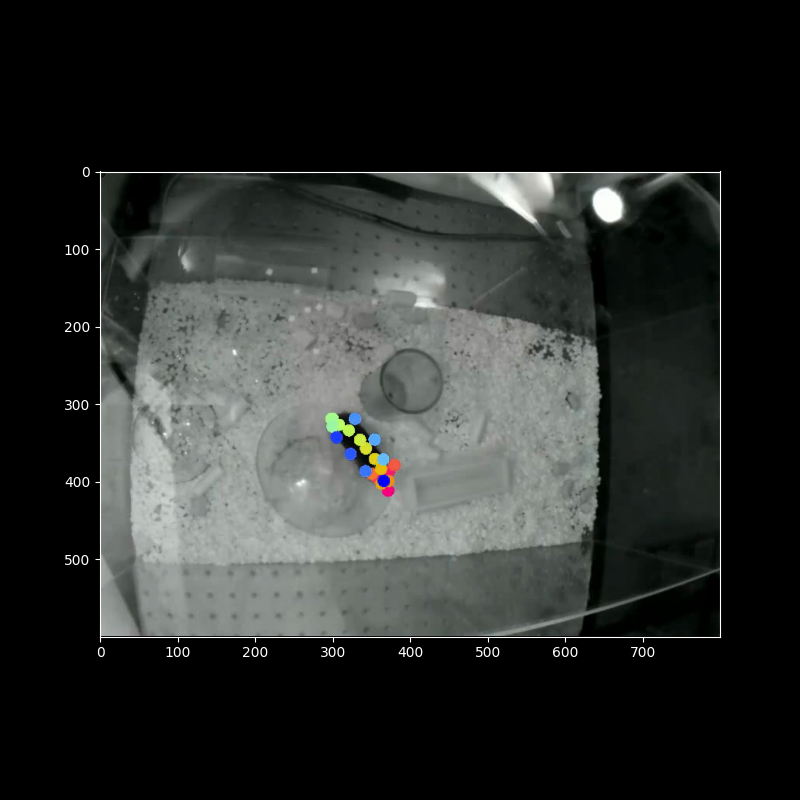

In [7]:
behavior_analysis = amadeus.get_behavior_analysis(video_file_path='../examples/MausHaus/maushaus_trimmed.mp4', #check the path to the video file
                                                  keypoint_file_path='../examples/MausHaus/maushaus_trimmed.h5') #check the path to the keypoint file

behavior_analysis.gui_manager.add_roi_from_video_selection()



### Press Esc when you are done drawing each ROI!!

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.0466 $
current input tokens 3142
current accumulated tokens 7688
doing active forgetting


To plot the trajectory of the animal using the animal center and color it by time, we can use the keypoint data for the 'mouse_center' keypoint. We will plot the trajectory on top of the scene image and color it based on the frame index to represent time. Let's proceed with the code:

```python
def plot_animal_trajectory(identifier):
    '''
    Parameters:
    ----------
    identifier: Identifier. Contains information about the video, keypoint and config
    '''
    # Create an instance of AnimalBehaviorAnalysis
    analysis = create_analysis(identifier)
    
    # Get keypoints and keypoint names
    keypoints = analysis.get_keypoints()  # shape (n_frames, n_individuals, n_kpts, n_dims)
    keypoint_names = analysis.get_keypoint_names()
    
    # Get the index for 'mouse_center'
    mouse_center_index = keypoint_names.index('mouse_center')
    
    # Extract the trajectory for 'mouse_center'
    # The shape of mouse_center_trajectory will be (n_frames, 2)
    mouse_center_trajectory = keypoints[:, 0, mouse_center_index, :]
    
    # Get the number of frames
    n_frames = analysis.get_data_length()
    
    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(8, 6))
    
    # Plot the trajectory, coloring by time
    scatter = ax.scatter(mouse_center_trajectory[:, 0], mouse_center_trajectory[:, 1], 
                         c=np.arange(n_frames), cmap='viridis', s=10)
    
    # Add a colorbar to show the time progression
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Frame Index (Time)')
    
    # Set axis limits to cover the whole image
    ax.set_xlim(0, 800)
    ax.set_ylim(0, 600)
    
    # Invert y-axis to match image coordinates
    ax.invert_yaxis()
    
    # Set labels and title
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.set_title('Animal Trajectory Colored by Time')
    
    # Return the figure and axis
    return fig, ax
```

This function will plot the trajectory of the animal's center ('mouse_center') and color it by time using a colormap. The y-axis is inverted to match the image coordinates, and the plot is overlaid on the scene image dimensions.

(<Figure size 800x600 with 2 Axes>, <AxesSubplot:title={'center':'Animal Trajectory Colored by Time'}, xlabel='X Coordinate', ylabel='Y Coordinate'>)

(<Figure size 800x600 with 2 Axes>, <AxesSubplot:title={'center':'Animal Trajectory Colored by Time'}, xlabel='X Coordinate', ylabel='Y Coordinate'>)

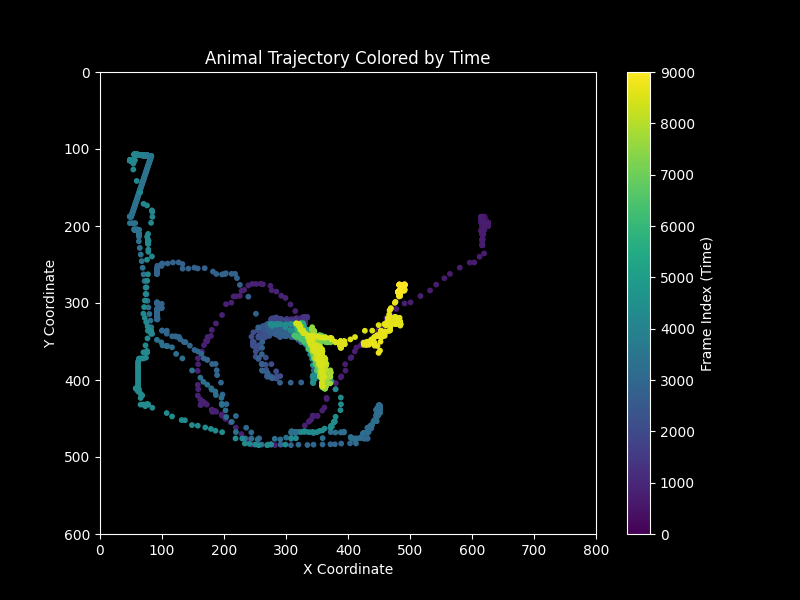

In [10]:
query = "Plot the trajectory of the animal using the animal center and color it by time"
qa_message = amadeus.step(query)
qa_message = parse_result(amadeus, qa_message)

In [11]:
query = "When does the mouse move from ROI0 to ROI1?"
qa_message = amadeus.step(query)
qa_message = parse_result(amadeus, qa_message)

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.0681 $
current input tokens 3337
current accumulated tokens 11345
doing active forgetting


To determine when the mouse moves from ROI0 to ROI1, we need to capture events where the mouse is in ROI0 and then moves to ROI1. We can use the `get_animals_object_events` function to capture these events. Let's proceed with the code:

```python
def get_movement_from_ROI0_to_ROI1_events(identifier):
    '''
    Parameters:
    ----------
    identifier: Identifier. Contains information about the video, keypoint and config
    '''
    # Create an instance of AnimalBehaviorAnalysis
    analysis = create_analysis(identifier)
    
    # Get events where the animal is in ROI0
    in_ROI0_events = analysis.get_animals_object_events(object_name='ROI0', query='overlap==True', negate=False)
    
    # Get events where the animal is in ROI1
    in_ROI1_events = analysis.get_animals_object_events(object_name='ROI1', query='overlap==True', negate=False)
    
    # Find events where the animal moves from ROI0 to ROI1
    movement_events = analysis.get_composite_events(events_A=in_ROI0_events, 
                                                    events_B=in_ROI1_events, 
                                                    composition_type='sequential', 
                                                    max_interval_between_sequential_events=15)
    
    return movement_events
```

This function will return a list of events where the mouse moves from ROI0 to ROI1. The `get_composite_events` function is used with the `sequential` composition type to ensure that the movement from ROI0 to ROI1 is captured.

### For a sequential event such as moving from ROI0 to ROI1, you will perhaps need to describe the interval between two events. If you got empty events above, try this below

INFO:httpx:HTTP Request: POST https://api.openai.com/v1/embeddings "HTTP/1.1 200 OK"
INFO:httpx:HTTP Request: POST https://api.openai.com/v1/chat/completions "HTTP/1.1 200 OK"


current total cost 0.0915 $
current input tokens 3654
current accumulated tokens 15343
doing active forgetting


To determine when the mouse moves from ROI0 to ROI1 with an interval of less than 100 frames, we can use the `get_composite_events` function with the `max_interval_between_sequential_events` parameter set to 100. Let's proceed with the code:

```python
def get_movement_from_ROI0_to_ROI1_within_100_frames(identifier):
    '''
    Parameters:
    ----------
    identifier: Identifier. Contains information about the video, keypoint and config
    '''
    # Create an instance of AnimalBehaviorAnalysis
    analysis = create_analysis(identifier)
    
    # Get events where the animal is in ROI0
    in_ROI0_events = analysis.get_animals_object_events(object_name='ROI0', query='overlap==True', negate=False)
    
    # Get events where the animal is in ROI1
    in_ROI1_events = analysis.get_animals_object_events(object_name='ROI1', query='overlap==True', negate=False)
    
    # Find events where the animal moves from ROI0 to ROI1 within 100 frames
    movement_events = analysis.get_composite_events(events_A=in_ROI0_events, 
                                                    events_B=in_ROI1_events, 
                                                    composition_type='sequential', 
                                                    max_interval_between_sequential_events=100)
    
    return movement_events
```

This function will return a list of events where the mouse moves from ROI0 to ROI1 with an interval of less than 100 frames. The `get_composite_events` function is used with the `sequential` composition type and the `max_interval_between_sequential_events` parameter set to 100 to capture these specific movements.

videos generated to defaultdict(<class 'list'>, {<amadeusgpt.behavior_analysis.identifier.Identifier object at 0x31df6ebd0>: ['results/maushaus_trimmed_get_movement_from_ROI0_to_ROI1_within_100_frames_video_0.mp4']})
Open it with media player if it does not properly display in the notebook


[<amadeusgpt.analysis_objects.event.Event object at 0x334797530>]

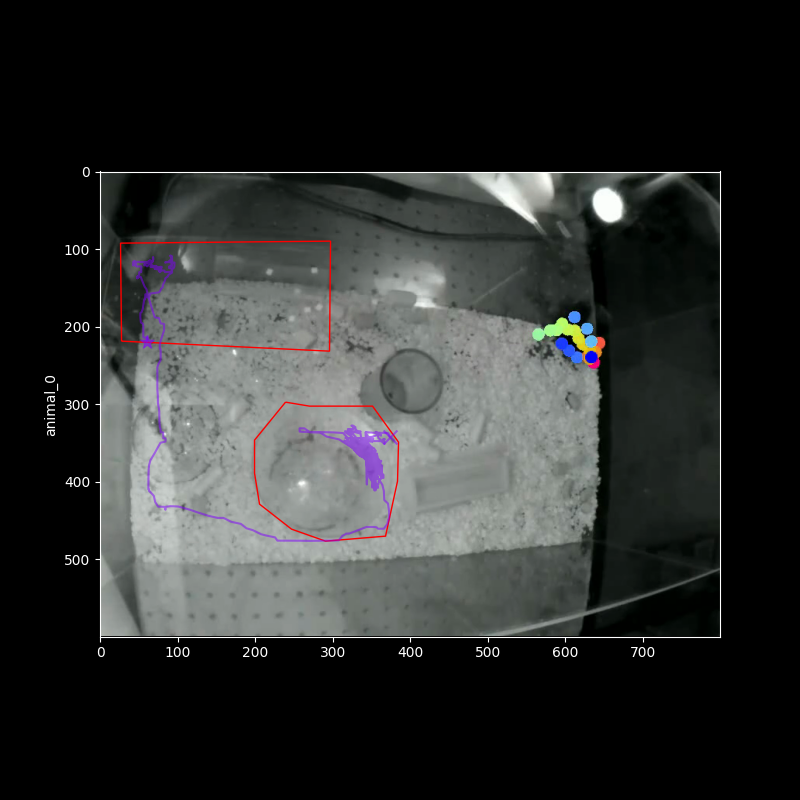

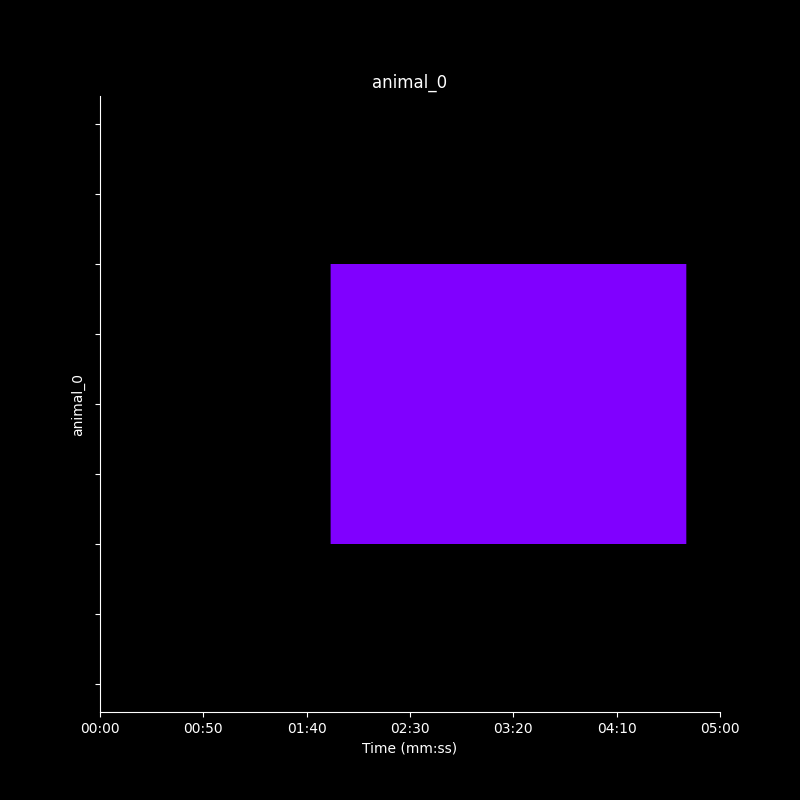

In [12]:
query = "When does the mouse move from ROI0 to ROI1. The interval should be less than 100 frames"
qa_message = amadeus.step(query)
qa_message = parse_result(amadeus, qa_message)

### You can get a list of binary masks (equivalent to ethogram) for the underlying behavior, if your query is about retriving a described behavior

In [ ]:
# the return masks is of shape (num_of_events, video_length)
# where each boolean array of (video_length,) is binary where True indicates whether the behavior is happening at that frame
masks = qa_message.get_masks()
print (masks)